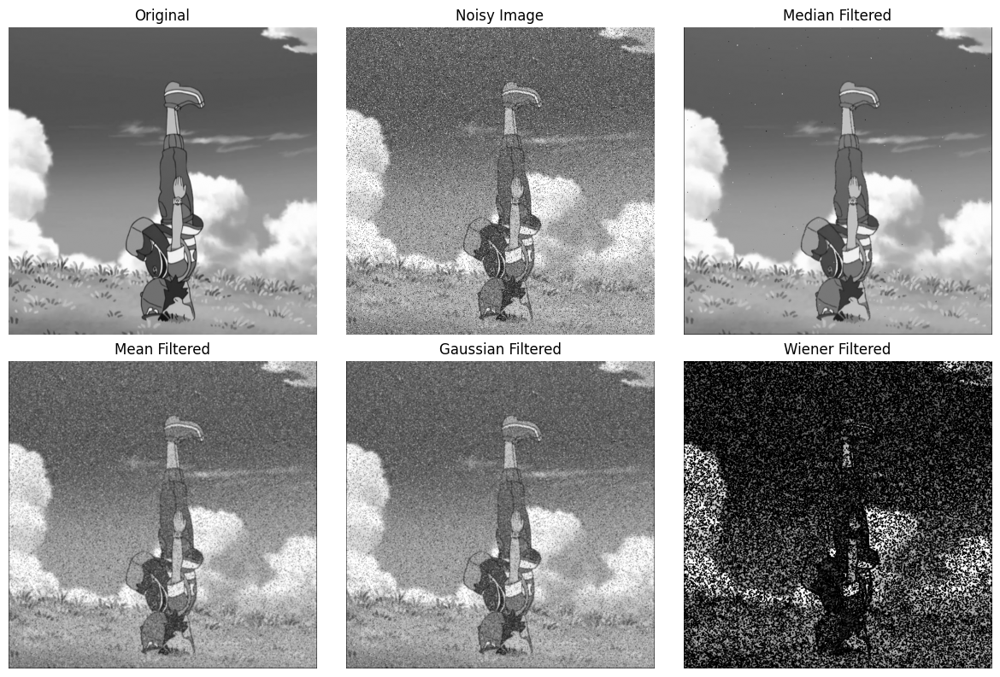

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('ash1.jpg', cv2.IMREAD_GRAYSCALE)


def add_noise(img, noise_type="salt_and_pepper", amount=0.05):
    noisy_img = img.copy()
    if noise_type == "salt_and_pepper":
        num_salt = int(amount * img.size * 0.5)
        num_pepper = int(amount * img.size * 0.5)

        # Salt (set random pixels to 255)
        salt_coords = [np.random.randint(0, i-1, num_salt) for i in img.shape]
        noisy_img[salt_coords[0], salt_coords[1]] = 255

        # Pepper (set random pixels to 0)
        pepper_coords = [np.random.randint(0, i-1, num_pepper) for i in img.shape]
        noisy_img[pepper_coords[0], pepper_coords[1]] = 0

    return noisy_img

def mean_filter(img):
    height, width = img.shape
    output_img = np.zeros_like(img)

    for i in range(1, height-1):
        for j in range(1, width-1):
            # 3x3 neighborhood
            neighborhood = img[i-1:i+2, j-1:j+2]
            output_img[i, j] = np.mean(neighborhood)

    return np.uint8(output_img)


def median_filter(img):
    height, width = img.shape
    output_img = np.zeros_like(img)

    for i in range(1, height-1):
        for j in range(1, width-1):
            # 3x3 neighborhood
            neighborhood = img[i-1:i+2, j-1:j+2]
            output_img[i, j] = np.median(neighborhood)

    return np.uint8(output_img)

def gaussian_filter(img):
    kernel = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]]) / 16  # 3x3 Gaussian kernel
    height, width = img.shape
    output_img = np.zeros_like(img)

    for i in range(1, height-1):
        for j in range(1, width-1):
            # 3x3 neighborhood
            neighborhood = img[i-1:i+2, j-1:j+2]
            output_img[i, j] = np.sum(neighborhood * kernel)

    return np.uint8(output_img)


def wiener_filter(img, kernel_size=3, noise_var=10):

    # Convert the image to float for precise calculations
    img = np.float32(img)

    # Initialize output image
    output_img = np.zeros_like(img)

    # Pad the image to handle borders
    padded_img = np.pad(img, ((kernel_size // 2, kernel_size // 2),
                              (kernel_size // 2, kernel_size // 2)), mode='constant')

    # Loop over each pixel to calculate local mean and variance
    for i in range(kernel_size // 2, img.shape[0] + kernel_size // 2):
        for j in range(kernel_size // 2, img.shape[1] + kernel_size // 2):
            # Extract the 3x3 neighborhood
            region = padded_img[i - kernel_size // 2:i + kernel_size // 2 + 1,
                                j - kernel_size // 2:j + kernel_size // 2 + 1]

            # Calculate local mean and variance
            local_mean = np.mean(region)
            local_var = np.var(region)

            # Apply the Wiener filter equation
            output_img[i - kernel_size // 2, j - kernel_size // 2] = local_mean - (local_var / noise_var)

    # Clip the result to ensure pixel values are within the valid range
    return np.uint8(np.clip(output_img, 0, 255))





def display_images(images, titles, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
    axes = axes.ravel()

    for i in range(len(images)):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].set_title(titles[i])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

noisy_img = add_noise(img, noise_type="salt_and_pepper", amount=0.15)

median_filtered = median_filter(noisy_img)
mean_filtered = mean_filter(noisy_img)

img_blur = cv2.GaussianBlur(img, (5, 5), 0)
gaussian_filtered = gaussian_filter(noisy_img)
wiener_filtered = wiener_filter(noisy_img)

images = [img,noisy_img, median_filtered, mean_filtered, gaussian_filtered, wiener_filtered]
titles = ['Original','Noisy Image', 'Median Filtered', 'Mean Filtered', 'Gaussian Filtered', 'Wiener Filtered']
display_images(images, titles, 2, 3)

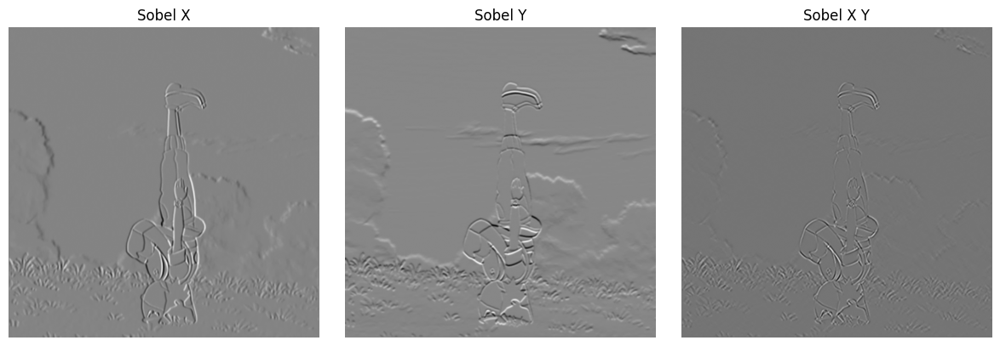

In [ ]:

# Read the original image
img = cv2.imread('ash1.jpg',flags=0)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img, (5, 5), 0)

# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

def display_sobel_images(sobel_images, titles):
    fig, axes = plt.subplots(1, len(sobel_images), figsize=(12, 4))

    for i, sobel_img in enumerate(sobel_images):
        axes[i].imshow(sobel_img, cmap='gray')
        axes[i].set_title(titles[i])
        axes[i].axis('off')

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()
sobel_images = [sobelx, sobely, sobelxy]
titles = ['Sobel X', 'Sobel Y', 'Sobel X Y']

# Call the function to display Sobel images
display_sobel_images(sobel_images, titles)


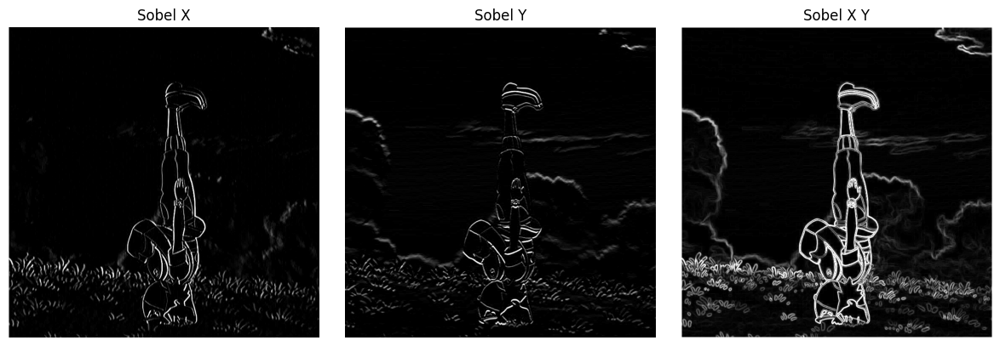

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
img = cv2.imread('ash1.jpg', flags=0)

# Sobel kernels for X and Y directions (3x3)
sobel_x_kernel = np.array([[-1, 0, 1],
                           [-2, 0, 2],
                           [-1, 0, 1]])

sobel_y_kernel = np.array([[-1, -2, -1],
                           [0, 0, 0],
                           [1, 2, 1]])

# Function to manually apply a kernel using convolution
def apply_kernel(img, kernel):
    # Pad the image with zeros around the border to handle edges
    padded_img = np.pad(img, ((1, 1), (1, 1)), mode='constant')
    output = np.zeros_like(img, dtype=np.float64)

    # Convolve the image with the kernel
    for i in range(1, img.shape[0] + 1):
        for j in range(1, img.shape[1] + 1):
            region = padded_img[i - 1:i + 2, j - 1:j + 2]
            output[i - 1, j - 1] = np.sum(region * kernel)

    return output

# Apply the Sobel kernels to the image
sobelx_manual = apply_kernel(img, sobel_x_kernel)
sobely_manual = apply_kernel(img, sobel_y_kernel)

# Combine the X and Y Sobel results (magnitude of the gradient)
sobelxy_manual = np.sqrt(sobelx_manual**2 + sobely_manual**2)

# Normalize the results to 8-bit (0-255) for display
sobelx_manual = np.uint8(np.clip(sobelx_manual, 0, 255))
sobely_manual = np.uint8(np.clip(sobely_manual, 0, 255))
sobelxy_manual = np.uint8(np.clip(sobelxy_manual, 0, 255))

# Display Sobel edge detection results
def display_sobel_images(sobel_images, titles):
    fig, axes = plt.subplots(1, len(sobel_images), figsize=(12, 4))

    for i, sobel_img in enumerate(sobel_images):
        axes[i].imshow(sobel_img, cmap='gray')
        axes[i].set_title(titles[i])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# List of Sobel images and their titles
sobel_images_manual = [sobelx_manual, sobely_manual, sobelxy_manual]
titles = ['Sobel X', 'Sobel Y', 'Sobel X Y']

# Display the Sobel images
display_sobel_images(sobel_images_manual, titles)


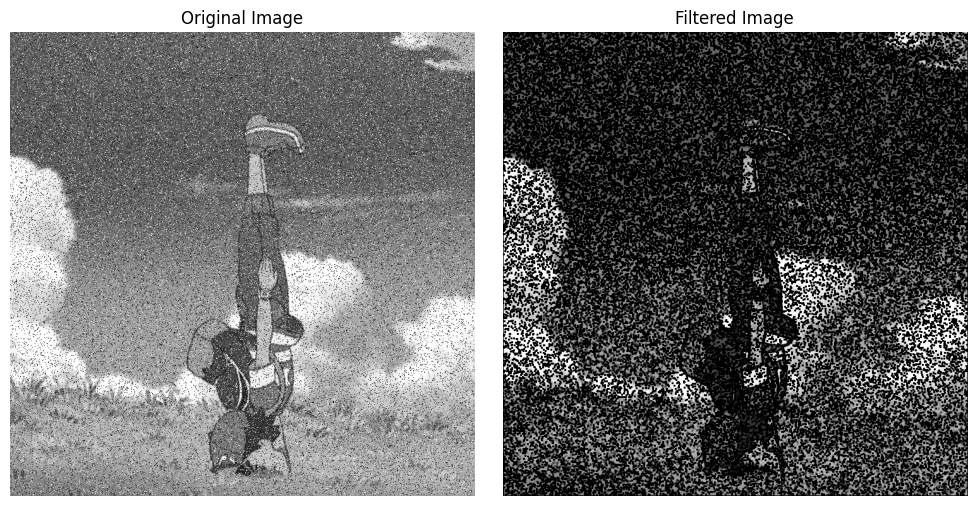

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def wiener_filter_manual(img, kernel_size=3, noise_var=10):

    # Convert image to float for calculation accuracy
    img = np.float32(img)

    # Get the image dimensions
    height, width = img.shape

    # Create an output image
    output_img = np.zeros_like(img)

    # Add padding around the image to handle borders
    padded_img = np.pad(img, ((kernel_size // 2, kernel_size // 2),
                              (kernel_size // 2, kernel_size // 2)), mode='constant')

    # Iterate over each pixel (excluding the borders)
    for i in range(height):
        for j in range(width):
            # Get the local neighborhood (3x3 window)
            neighborhood = padded_img[i:i+kernel_size, j:j+kernel_size]

            # Calculate the local mean and variance
            local_mean = np.mean(neighborhood)
            local_var = np.var(neighborhood)

            # Wiener filter formula: output = mean - (variance / noise variance)
            output_img[i, j] = local_mean - (local_var / noise_var)

    # Clip the output to valid pixel range [0, 255]
    output_img = np.clip(output_img, 0, 255)

    return np.uint8(output_img)

# Read the noisy image
img = cv2.imread('ash1.jpg', cv2.IMREAD_GRAYSCALE)

# Apply the Wiener filter
filtered_img = wiener_filter_manual(noisy_img)

# Display the original and filtered images using matplotlib
plt.figure(figsize=(10, 5))

# Display original image
plt.subplot(1, 2, 1)
plt.imshow(noisy_img, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Display filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_img, cmap='gray')
plt.title("Filtered Image")
plt.axis('off')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import wiener
from skimage.restoration import denoise_tv_chambolle

def add_noise(img, noise_type="gaussian"):
    row, col, ch = img.shape
    if noise_type == "gaussian":
        mean, sigma = 0, 25
        gauss = np.random.normal(mean, sigma, (row, col, ch)).astype(np.uint8)
        noisy = cv2.add(img, gauss)
    elif noise_type == "salt_pepper":
        s_vs_p, amount = 0.5, 0.02
        noisy = img.copy()
        num_salt = np.ceil(amount * img.size * s_vs_p)
        num_pepper = np.ceil(amount * img.size * (1.0 - s_vs_p))
        coords_salt = [np.random.randint(0, i - 1, int(num_salt)) for i in img.shape]
        coords_pepper = [np.random.randint(0, i - 1, int(num_pepper)) for i in img.shape]
        noisy[tuple(coords_salt)] = 255
        noisy[tuple(coords_pepper)] = 0
    elif noise_type == "speckle":
        gauss = np.random.randn(row, col, ch).astype(np.float32)
        noisy = img + img * gauss
    elif noise_type == "poisson":
        noisy = np.random.poisson(img).astype(np.uint8)
    elif noise_type == "periodic":
        x = np.arange(col)
        y = np.arange(row)
        X, Y = np.meshgrid(x, y)
        sinusoidal = (np.sin(2 * np.pi * X / 10) * 50).astype(np.uint8)
        noisy = cv2.add(img, sinusoidal[:, :, np.newaxis])
    else:
        noisy = img
    return noisy

def remove_noise(img, filter_type="gaussian"):
    if filter_type == "gaussian":
        return cv2.GaussianBlur(img, (5, 5), 1)
    elif filter_type == "median":
        return cv2.medianBlur(img, 5)
    elif filter_type == "bilateral":
        return cv2.bilateralFilter(img, 9, 75, 75)
    elif filter_type == "wiener":
        return wiener(img, (5, 5))
    elif filter_type == "tv_denoise":
        return denoise_tv_chambolle(img, weight=0.1, multichannel=True)
    else:
        return img

# img = cv2.imread("image.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

noise_types = ["gaussian", "salt_pepper", "speckle", "poisson", "periodic"]
filter_types = ["gaussian", "median", "bilateral", "wiener", "tv_denoise"]

fig, axes = plt.subplots(len(noise_types), len(filter_types) + 1, figsize=(15, 10))
for i, noise in enumerate(noise_types):
    noisy_img = add_noise(img, noise)
    axes[i, 0].imshow(noisy_img)
    axes[i, 0].set_title(f"{noise} Noise")
    axes[i, 0].axis("off")
    for j, filter_name in enumerate(filter_types):
        denoised = remove_noise(noisy_img, filter_name)
        axes[i, j + 1].imshow(denoised)
        axes[i, j + 1].set_title(f"{filter_name} Filter")
        axes[i, j + 1].axis("off")
plt.tight_layout()
plt.show()


error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Load image in grayscale
img = cv2.imread('ashgoh.png', cv2.IMREAD_GRAYSCALE)

# Noise functions
def add_gaussian_noise(img, mean=0, std=25):
    return np.clip(img + np.random.normal(mean, std, img.shape), 0, 255).astype(np.uint8)

def add_salt_pepper_noise(img, prob=0.02):
    noisy = img.copy()
    salt = np.random.rand(*img.shape) < prob / 2
    pepper = np.random.rand(*img.shape) < prob / 2
    noisy[salt] = 255
    noisy[pepper] = 0
    return noisy

def add_poisson_noise(img):
    return np.clip(np.random.poisson(img), 0, 255).astype(np.uint8)

def add_speckle_noise(img):
    return np.clip(img + img * np.random.normal(0, 0.2, img.shape), 0, 255).astype(np.uint8)

def add_uniform_noise(img, low=-25, high=25):
    return np.clip(img + np.random.uniform(low, high, img.shape), 0, 255).astype(np.uint8)


# Filter functions
def mean_filter(img, ksize=3):
    kernel = np.ones((ksize, ksize)) / (ksize * ksize)
    return convolve2d(img, kernel, mode='same', boundary='symm').astype(np.uint8)

def median_filter(img, ksize=3):
    pad = ksize // 2
    padded = np.pad(img, pad, mode='edge')
    filtered = np.zeros_like(img)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            filtered[i, j] = np.median(padded[i:i+ksize, j:j+ksize])
    return filtered

def gaussian_filter(img, ksize=3, sigma=1):
    ax = np.linspace(-(ksize // 2), ksize // 2, ksize)
    kernel = np.exp(-0.5 * (ax[:, None]**2 + ax[None, :]**2) / sigma**2)
    kernel /= kernel.sum()
    return convolve2d(img, kernel, mode='same', boundary='symm').astype(np.uint8)

def wiener_filter(img, ksize=3):
    local_mean = mean_filter(img, ksize)
    local_var = mean_filter(img**2, ksize) - local_mean**2
    noise_var = np.var(img - local_mean)
    return np.clip(local_mean + (local_var / (local_var + noise_var)) * (img - local_mean), 0, 255).astype(np.uint8)

# Dictionary of noise functions
noise_funcs = {
    "Gaussian Noise": add_gaussian_noise,
    "Salt & Pepper Noise": add_salt_pepper_noise,
    "Poisson Noise": add_poisson_noise,
    "Speckle Noise": add_speckle_noise,
    "Uniform Noise": add_uniform_noise,

}

# Dictionary of filter functions
filter_funcs = {
    "Mean Filter": mean_filter,
    "Median Filter": median_filter,
    "Gaussian Filter": gaussian_filter,
    "Wiener Filter": wiener_filter
}

# Apply all noises
noisy_images = {name: func(img) for name, func in noise_funcs.items()}

# Apply all filters to each noisy image
filtered_images = {n_name: {f_name: f_func(n_img) for f_name, f_func in filter_funcs.items()} for n_name, n_img in noisy_images.items()}

# Display all noise-applied images
fig, axes = plt.subplots(3, 3, figsize=(12, 6))
axes = axes.ravel()
axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

for i, (name, noisy_img) in enumerate(noisy_images.items(), 1):
    axes[i].imshow(noisy_img, cmap='gray')
    axes[i].set_title(name)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Display all filtered images for each noise type
for noise_name, noisy_img in noisy_images.items():
    fig, axes = plt.subplots(1, 5, figsize=(15, 4))
    axes[0].imshow(noisy_img, cmap='gray')
    axes[0].set_title(f"{noise_name} (Noisy)")
    axes[0].axis('off')

    for i, (filter_name, filtered_img) in enumerate(filtered_images[noise_name].items(), 1):
        axes[i].imshow(filtered_img, cmap='gray')
        axes[i].set_title(filter_name)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
Gaussian Noise (random variations following a normal distribution)
Best Filter: Gaussian Filter or Wiener Filter
Gaussian filter helps smooth out the random variations.
Wiener filter adapts to local noise levels.



Salt & Pepper Noise (random white/black pixels)
Best Filter: Median Filter
Median filtering effectively removes isolated white and black pixels while preserving edges.


Poisson Noise (intensity-dependent noise)
Best Filter: Wiener Filter
Wiener filtering adapts based on local variance and is effective for Poisson noise.


Speckle Noise (multiplicative noise that varies with intensity)
Best Filter: Gaussian Filter or Wiener Filter
Gaussian smoothing reduces small fluctuations.
Wiener filtering is adaptive, making it more effective in some cases.


Uniform Noise (random noise with equal probability distribution)
Best Filter: Mean Filter or Gaussian Filter
Mean filtering averages out uniform noise effectively.
Gaussian filtering provides additional smoothness.


Multiplicative Noise (scales pixel values randomly)
Best Filter: Wiener Filter
Wiener filter adjusts based on local statistics, making it suitable for multiplicative noise.

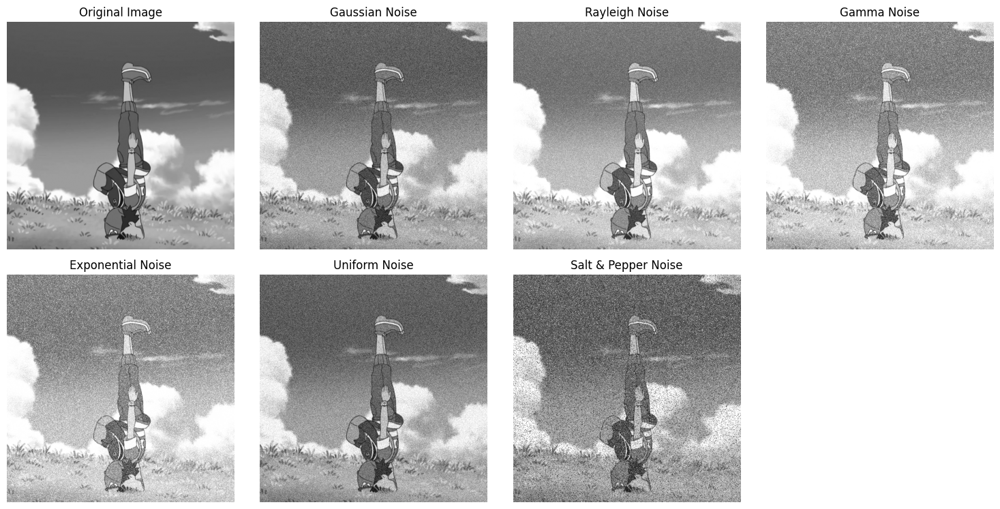

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Helper function to clip and convert images
def clip_and_convert(img):
    return np.clip(img, 0, 255).astype(np.uint8)

# Generalized noise generation function
def add_noise(img, noise_type='gaussian', **params):

    if noise_type == 'gaussian':
        mean = params.get('mean', 0)
        sigma = params.get('sigma', 25)
        noise = np.random.normal(loc=mean, scale=sigma, size=img.shape)

    elif noise_type == 'rayleigh':
        scale = params.get('scale', 30)
        noise = np.random.rayleigh(scale, size=img.shape)

    elif noise_type == 'gamma':
        shape = params.get('shape', 2.0)
        scale = params.get('scale', 25.0)
        noise = np.random.gamma(shape, scale, size=img.shape)

    elif noise_type == 'exponential':
        scale = params.get('scale', 1)
        lambda_param = params.get('lambdaa', 0.02)
        noise = np.random.exponential(scale / lambda_param, size=img.shape)

    elif noise_type == 'uniform':
        low = params.get('low', -50)
        high = params.get('high', 50)
        noise = np.random.uniform(low, high, size=img.shape)

    elif noise_type == 'salt_pepper':
        salt_prob = params.get('salt_prob', 0.1)
        pepper_prob = params.get('pepper_prob', 0.1)
        noise_img = img.copy()
        total_pixel = img.size

        # Salt noise
        num_salt = int(total_pixel * salt_prob)
        salt_coords = tuple(np.random.randint(0, i, num_salt) for i in img.shape)
        noise_img[salt_coords] = 255

        # Pepper noise
        num_pepper = int(total_pixel * pepper_prob)
        pepper_coords = tuple(np.random.randint(0, i, num_pepper) for i in img.shape)
        noise_img[pepper_coords] = 0

        return noise_img

    noisena= clip_and_convert(img + noise)
    return noisena



def display_images(images, titles):
    plt.figure(figsize=(15, 15))
    num_images = len(images)

    nrows = (num_images + 1) // 2
    ncols = 4

    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(nrows, ncols, i)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

gray_img =  cv2.imread('ash1.jpg', cv2.IMREAD_GRAYSCALE)


images = [
    gray_img,
    add_noise(gray_img, 'gaussian', mean=0, sigma=25),
    add_noise(gray_img, 'rayleigh', scale=30),
    add_noise(gray_img, 'gamma', shape=2.0, scale=25.0),
    add_noise(gray_img, 'exponential', scale=1, lambdaa=0.02),
    add_noise(gray_img, 'uniform', low=-50, high=50),
    add_noise(gray_img, 'salt_pepper', salt_prob=0.1, pepper_prob=0.1)
]

titles = [
    "Original Image",
    "Gaussian Noise",
    "Rayleigh Noise",
    "Gamma Noise",
    "Exponential Noise",
    "Uniform Noise",
    "Salt & Pepper Noise"
]

display_images(images, titles)


array([[ 99,  99,  99, ..., 205, 206, 207],
       [ 99,  99,  99, ..., 203, 203, 204],
       [ 99,  99,  99, ..., 198, 199, 199],
       ...,
       [127, 127, 126, ..., 164, 164, 164],
       [127, 127, 126, ..., 162, 162, 162],
       [127, 127, 126, ..., 161, 161, 161]], dtype=uint8)
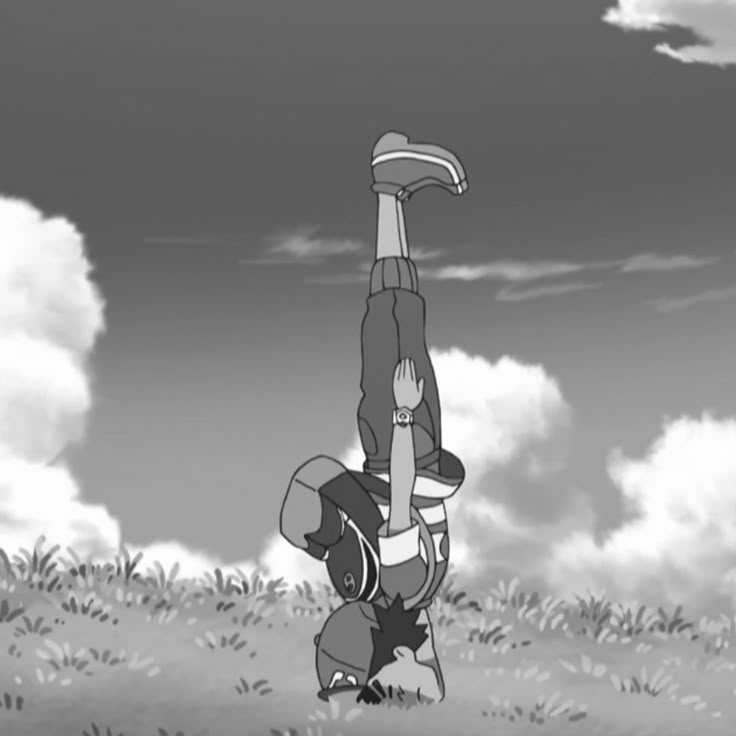

In [ ]:
import cv2
# Helper function to clip and convert images
def clip_and_convert(img):
    return np.clip(img, 0, 255).astype(np.uint8)

imgg= cv2.imread('ash1.jpg', cv2.IMREAD_GRAYSCALE)

clip_and_convert(imgg)

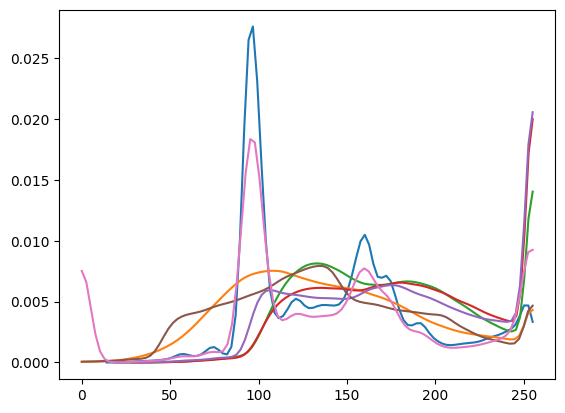

In [ ]:

def plot_kde(noise, title):
    kde = gaussian_kde(noise.reshape(-1))
    dist_space = np.linspace(np.min(noise), np.max(noise), 100)
    plt.plot(dist_space, kde(dist_space), label=title)

for img, title in zip(images, titles):
    plot_kde(img, title)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Manual Convolution Function with Optimizations
def convolve_manual(image, kernel):
    kernel_size = kernel.shape[0]
    pad = kernel_size // 2
    h, w = image.shape
    result = np.zeros_like(image, dtype=np.float32)

    # Pad the image manually
    padded_image = np.pad(image, pad, mode='constant', constant_values=0)

    # Apply convolution manually
    for i in range(h):
        for j in range(w):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            result[i, j] = np.sum(region * kernel)

    return np.clip(result, 0, 255).astype(np.uint8)

# Arithmetic Mean Filter (fully manual)
def arith_mean_filter(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) / (kernel_size ** 2)
    return convolve_manual(image, kernel)

# Geometric Mean Filter (fully manual)
def geometric_mean_filter(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
    h, w = image.shape
    padded_image = np.pad(image, kernel_size // 2, mode='constant', constant_values=1)
    result = np.zeros_like(image, dtype=np.float32)

    for i in range(h):
        for j in range(w):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            result[i, j] = np.exp(np.mean(np.log(region.astype(np.float32) + 1e-5)))

    return np.clip(result, 0, 255).astype(np.uint8)

# Harmonic Mean Filter (fully manual)
def harmonic_mean_filter(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
    h, w = image.shape
    padded_image = np.pad(image, kernel_size // 2, mode='constant', constant_values=1)
    result = np.zeros_like(image, dtype=np.float32)

    for i in range(h):
        for j in range(w):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            result[i, j] = 1 / np.mean(1.0 / (region.astype(np.float32) + 1e-8))

    return np.clip(result, 0, 255).astype(np.uint8)

# Contraharmonic Mean Filter (fully manual)
def contraharmonic_mean_filter(image, kernel_size=3, Q=0):
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
    h, w = image.shape
    padded_image = np.pad(image, kernel_size // 2, mode='constant', constant_values=1)
    result = np.zeros_like(image, dtype=np.float32)

    for i in range(h):
        for j in range(w):
            region = padded_image[i:i+kernel_size, j:j+kernel_size].astype(np.float32)
            num = np.sum(region ** (Q + 1))
            den = np.sum(region ** Q) + 1e-8
            result[i, j] = num / den

    return np.clip(result, 0, 255).astype(np.uint8)


gray_img = cv2.imread('ash1.jpg', cv2.IMREAD_GRAYSCALE)
gaussian_img = gray_img + np.random.normal(0, 25, gray_img.shape).astype(np.uint8)

# Apply filters
filtered_img = arith_mean_filter(gaussian_img, kernel_size=3)
geometric_img = geometric_mean_filter(gaussian_img, kernel_size=3)
harmonic_img = harmonic_mean_filter(gaussian_img, kernel_size=3)
contra_harmonic_img = contraharmonic_mean_filter(gaussian_img, kernel_size=3, Q=0)

# Display images
images = [gray_img, gaussian_img, filtered_img, geometric_img, harmonic_img, contra_harmonic_img]
titles = ["Original Image", "Noisy Image", "Arithmetic Mean Filter",
          "Geometric Mean Filter", "Harmonic Mean Filter", "Contraharmonic Mean Filter"]

display_images(images, titles)


NameError: name 'kernel_size' is not defined

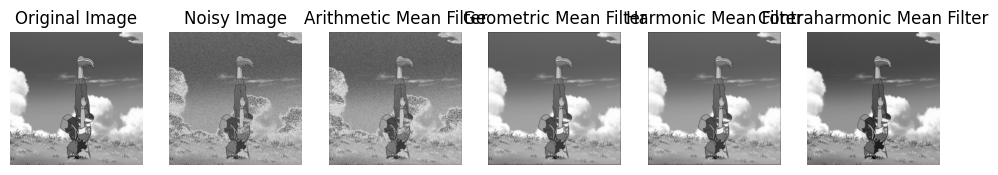

In [ ]:
import numpy as np
# Manual Convolution Function with Optimizations
def convolve_manual(image, kernel):
    kernel_size = kernel.shape[0]
    pad = kernel_size // 2
    h, w = image.shape
    result = np.zeros_like(image, dtype=np.float32)

    # Pad the image manually
    padded_image = np.pad(image, pad, mode='constant', constant_values=0)

    # Apply convolution manually
    for i in range(h):
        for j in range(w):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            result[i, j] = np.sum(region * kernel)

    return np.clip(result, 0, 255).astype(np.uint8)

# Arithmetic Mean Filter (fully manual)
def arith_mean_filter(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) / (kernel_size ** 2)
    return convolve_manual(image, kernel)

# Manual padding


def pad_image(image, kernel_size):
    """Manually pad the image with the given kernel size."""
    pad = kernel_size // 2
    h, w = image.shape
    padded_image = np.zeros((h + 2 * pad, w + 2 * pad), dtype=np.float32)

    # Copy the original image into the center of the padded image
    for i in range(h):
        for j in range(w):
            padded_image[i + pad, j + pad] = image[i, j]

    return padded_image

# General manual filter function
def filter_image(image, kernel_size, filter_func):
    """Manually apply a filter using the provided function."""
    h, w = image.shape
    padded_image = pad_image(image, kernel_size)  # Apply padding
    result = np.zeros_like(image, dtype=np.float32)

    # Apply filter by iterating over each pixel
    for i in range(h):
        for j in range(w):
            # Extract the region of interest manually
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            # Apply the filter function manually to the region
            result[i, j] = filter_func(region)

    return np.clip(result, 0, 255).astype(np.uint8)

# Manual Contraharmonic Mean Filter
def contraharmonic_mean(region, Q):
    """Manually apply contraharmonic mean filter to the region."""
    num = 0.0
    den = 0.0
    for i in range(region.shape[0]):
        for j in range(region.shape[1]):
            num += region[i, j] ** (Q + 1)
            den += region[i, j] ** Q

    return num / (den + 1e-8)  # Adding small constant to avoid division by zero

# Manual Geometric Mean Filter
def geometric_mean(region):
    """Manually apply geometric mean filter to the region."""
    product = 1.0
    for i in range(region.shape[0]):
        for j in range(region.shape[1]):
            product *= region[i, j] + 1e-5  # Avoid log(0)

    return np.exp(np.log(product) / region.size)

# Manual Harmonic Mean Filter
def harmonic_mean(region):
    """Manually apply harmonic mean filter to the region."""
    reciprocal_sum = 0.0
    for i in range(region.shape[0]):
        for j in range(region.shape[1]):
            reciprocal_sum += 1.0 / (region[i, j] + 1e-8)  # Avoid division by zero

    return region.size / reciprocal_sum

# Example usage
img = cv2.imread('ash1.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Contraharmonic Mean Filter with Q=1 (for example)
filtered_contraharmonic = filter_image(img, kernel_size=3, filter_func=lambda region: contraharmonic_mean(region, Q=1))

# Apply Geometric Mean Filter
filtered_geometric = filter_image(img, kernel_size=3, filter_func=geometric_mean)

filtered_img = arith_mean_filter(gaussian_img, kernel_size=3)
# Apply Harmonic Mean Filter
filtered_harmonic = filter_image(img, kernel_size=3, filter_func=harmonic_mean)


gray_img = cv2.imread('ash1.jpg', cv2.IMREAD_GRAYSCALE)
gaussian_img = gray_img + np.random.normal(0, 25, gray_img.shape).astype(np.uint8)



In [ ]:
def display_images(images, titles):
    plt.figure(figsize=(15, 15))
    num_images = len(images)

    nrows = (num_images + 1) // 2
    ncols = 4

    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(nrows, ncols, i)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

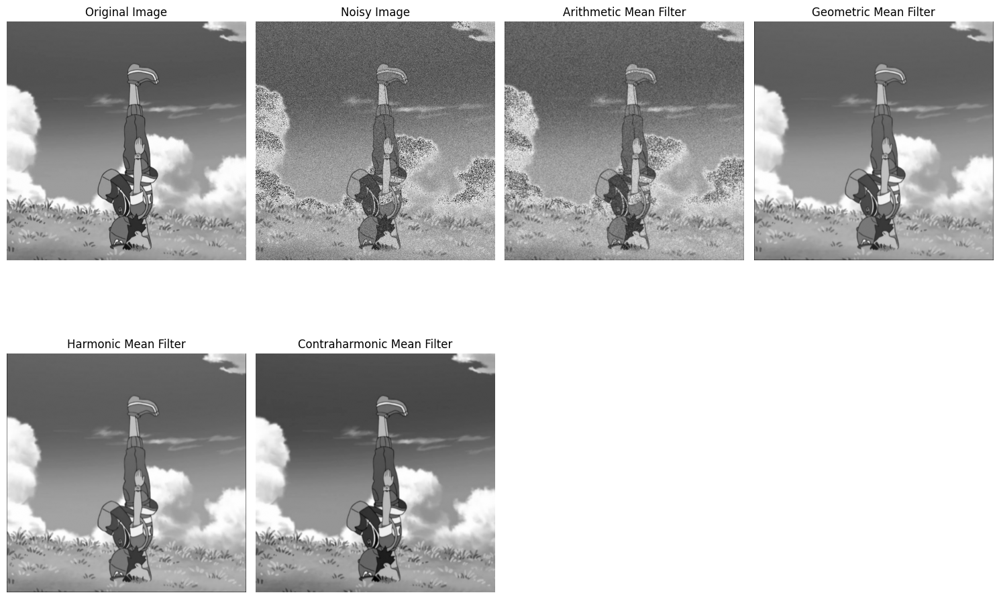

In [ ]:
images = [img, gaussian_img, filtered_img, filtered_geometric, filtered_harmonic, filtered_contraharmonic]
titles = ["Original Image", "Noisy Image", "Arithmetic Mean Filter",
          "Geometric Mean Filter", "Harmonic Mean Filter", "Contraharmonic Mean Filter"]

display_images(images, titles)

In [ ]:
def apply_filter(image, kernel_size, filter_type, d=0):
    h, w = image.shape
    pad = kernel_size // 2
    filtered_image = np.zeros_like(image, dtype=np.float32)
    padded_image = cv2.copyMakeBorder(image, pad, pad, pad, pad, cv2.BORDER_REPLICATE)

    for i in range(h):
        for j in range(w):
            neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size].flatten()

            if filter_type == "median":
                filtered_image[i, j] = np.median(neighborhood)
            elif filter_type == "min":
                filtered_image[i, j] = np.min(neighborhood)
            elif filter_type == "max":
                filtered_image[i, j] = np.max(neighborhood)
            elif filter_type == "midpoint":
                min_val = float(np.min(neighborhood))
                max_val = float(np.max(neighborhood))
                filtered_image[i, j] = (min_val + max_val) / 2
            elif filter_type == "alpha_trimmed":
                sorted_vals = np.sort(neighborhood)
                trimmed_vals = sorted_vals[d: -d] if d > 0 else sorted_vals
                filtered_image[i, j] = np.mean(trimmed_vals)

    return np.uint8(np.clip(filtered_image, 0, 255))


sp_img = add_noise(gray_img, 'salt_pepper', salt_prob=0.1, pepper_prob=0.1)
kernel_size = 3
filtered_median = apply_filter(sp_img, kernel_size, "median")
filtered_min = apply_filter(sp_img, kernel_size, "min")
filtered_max = apply_filter(sp_img, kernel_size, "max")
filtered_midpoint = apply_filter(sp_img, kernel_size, "midpoint")
filtered_alpha_trimmed = apply_filter(sp_img, kernel_size, "alpha_trimmed", d=2)

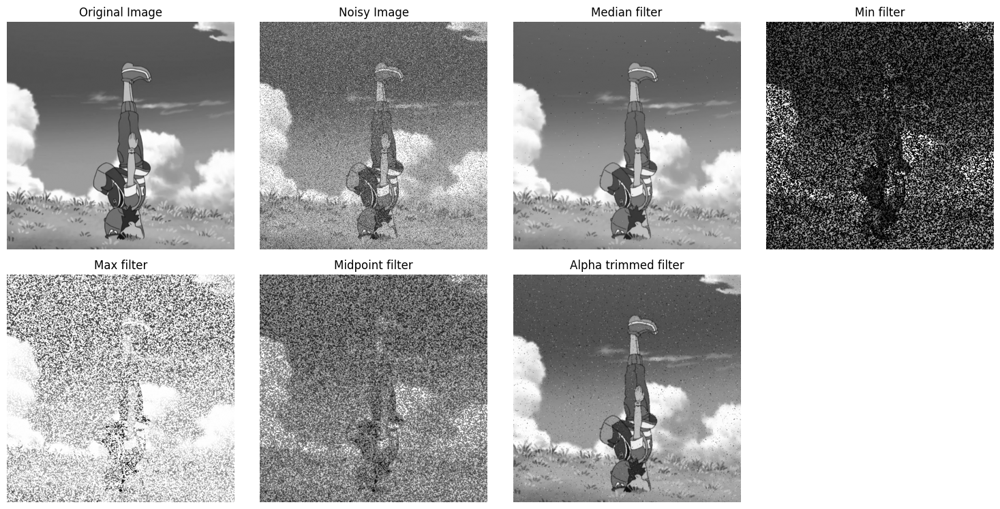

In [ ]:
images = [gray_img,sp_img,filtered_median,filtered_min,filtered_max,filtered_midpoint,filtered_alpha_trimmed]
titles = ["Original Image","Noisy Image",
          "Median filter","Min filter","Max filter","Midpoint filter","Alpha trimmed filter"]

display_images(images, titles)

In [ ]:
import numpy as np
import cv2

# Fully Manual Adaptive Median Filter
def adaptive_median_filter(image, max_kernel_size=7):
    h, w = image.shape
    output = image.copy()

    for i in range(h):
        for j in range(w):
            kernel_size = 3
            while kernel_size <= max_kernel_size:
                pad = kernel_size // 2
                # Extract region of interest
                region = image[max(0, i - pad):min(h, i + pad + 1), max(0, j - pad):min(w, j + pad + 1)]

                min_val, med_val, max_val = np.min(region), np.median(region), np.max(region)

                # Check if the median is valid, otherwise increase the kernel size
                if min_val < med_val < max_val:
                    output[i, j] = med_val if image[i, j] in [min_val, max_val] else image[i, j]
                    break
                kernel_size += 2

    return output

# Fully Manual Adaptive Mean Filter
def adaptive_mean_filter(image, kernel_size=5):
    h, w = image.shape
    pad = kernel_size // 2
    output = image.astype(np.float32)

    # Pad image manually (border replication)
    padded_image = np.pad(image, pad, mode='edge')

    global_variance = np.var(image)

    for i in range(h):
        for j in range(w):
            # Extract region of interest
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            local_mean = np.mean(region)
            local_variance = np.var(region)

            # Apply the formula
            if local_variance > 0:
                output[i, j] = image[i, j] - (global_variance / local_variance) * (image[i, j] - local_mean)
            else:
                output[i, j] = local_mean

    return np.uint8(np.clip(output, 0, 255))

filtered_adaptive_median = adaptive_median_filter(sp_img, max_kernel_size=7)
filtered_adaptive_mean = adaptive_mean_filter(sp_img, kernel_size=5)




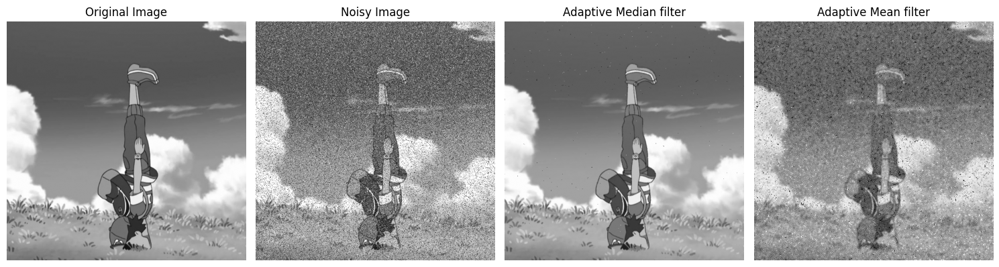

In [ ]:
images = [gray_img,sp_img,filtered_adaptive_median,filtered_adaptive_mean]
titles = ["Original Image","Noisy Image",
          "Adaptive Median filter","Adaptive Mean filter"]

display_images(images, titles)

In [ ]:
import numpy as np

def sobel_filter(image, kernel_size='small'):
    # Define Sobel kernels for X and Y gradients
    kernels = {
        'big': (np.array([[1, 2, 3, 2, 1], [2, 3, 5, 3, 2], [0, 0, 0, 0, 0], [-2, -3, -5, -3, -2], [-1, -2, -3, -2, -1]]),
                np.array([[1, 2, 3, 2, 1], [0, 0, 0, 0, 0], [-1, -2, -3, -2, -1], [-2, -3, -5, -3, -2], [-1, -2, -3, -2, -1]])),
        'medium': (np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]), np.array([[1, 2, 3], [0, 0, 0], [-1, -2, -3]])),
        'small': (np.array([[0, 1], [-1, 0]]), np.array([[1, 0], [0, -1]]))
    }

    kernel_x, kernel_y = kernels[kernel_size]
    h, w = image.shape

    # Padding for borders
    pad = kernel_x.shape[0] // 2
    padded_image = np.pad(image, ((pad, pad), (pad, pad)), mode='constant')

    # Gradient calculation in both directions (X and Y)
    gradient_x = np.zeros_like(image, dtype=np.float32)
    gradient_y = np.zeros_like(image, dtype=np.float32)

    for i in range(h):
        for j in range(w):
            region = padded_image[i:i + kernel_x.shape[0], j:j + kernel_x.shape[1]]
            gradient_x[i, j] = np.sum(region * kernel_x)
            gradient_y[i, j] = np.sum(region * kernel_y)



    # Magnitude of gradients (edge strength)
    sobel_img = np.sqrt(gradient_x**2 + gradient_y**2)

    # Normalize the output image to the range [0, 255]
    sobel_img = np.clip(sobel_img, 0, 255)

    # If the image has no gradient (uniform or completely black image)
    # if np.max(sobel_img) == 0:
    #     return np.zeros_like(image, dtype=np.uint8)

    # # Normalize for better contrast, ensuring the value range is [0, 255]
    # sobel_img = ((sobel_img - np.min(sobel_img)) / (np.max(sobel_img) - np.min(sobel_img)) * 255).astype(np.uint8)

    return sobel_img



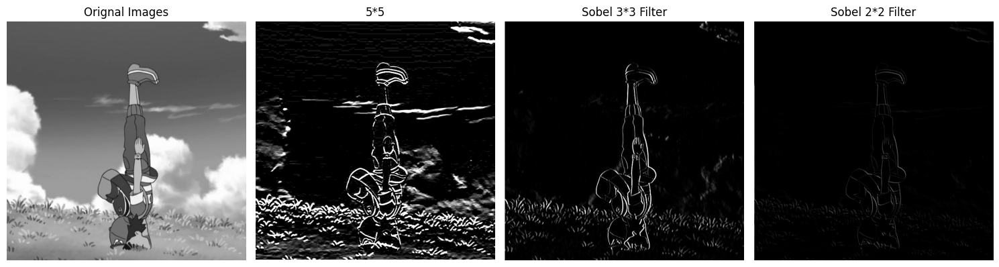

In [ ]:
sobel_kernel_1 = sobel_filter(gray_img,'big')
sobel_kernel_2 = sobel_filter(gray_img,'medium')
sobel_kernel_3 = sobel_filter(gray_img,'small')

images = [gray_img,sobel_kernel_1,sobel_kernel_2,sobel_kernel_3]
titles = ["Orignal Images","5*5","Sobel 3*3 Filter","Sobel 2*2 Filter"]

display_images(images,titles)


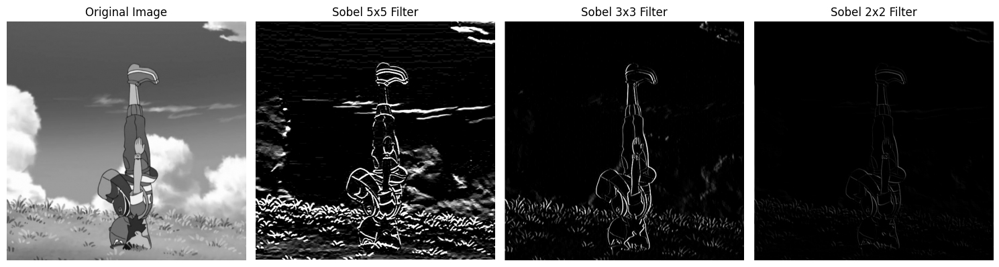

In [ ]:
def sobel_filter(image, size):
    image = image.astype(np.float32)
    height, width = image.shape

    sobel_kernel1 = np.array([[0, 1],
                              [-1, 0]])

    sobel_kernel2 = np.array([[-1, 0, 1],
                               [-2, 0, 2],
                               [-1, 0, 1]])

    sobel_kernel3 = np.array([[1, 2, 3, 2, 1],
                               [2, 3, 5, 3, 2],
                               [0, 0, 0, 0, 0],
                               [-2, -3, -5, -3, -2],
                               [-1, -2, -3, -2, -1]])

    if size == 'big':
        sobel_kernel = sobel_kernel3
    elif size == 'medium':
        sobel_kernel = sobel_kernel2
    else:
        sobel_kernel = sobel_kernel1


    padding = sobel_kernel.shape[0] // 2
    padded_img = np.pad(image, ((padding, padding), (padding, padding)), mode='constant', constant_values=0)

    sobel_img = np.zeros_like(image)

    for i in range(height):
        for j in range(width):
            region = padded_img[i:i + sobel_kernel.shape[0], j:j + sobel_kernel.shape[1]]
            if region.shape == sobel_kernel.shape:
                sobel_img[i, j] = np.sum(region * sobel_kernel)

    return np.clip(sobel_img, 0, 255)


sobel_kernel_1 = sobel_filter(gray_img, 'big')
sobel_kernel_2 = sobel_filter(gray_img, 'medium')
sobel_kernel_3 = sobel_filter(gray_img, 'small')


images = [gray_img, sobel_kernel_1, sobel_kernel_2, sobel_kernel_3]
titles = ["Original Image", "Sobel 5x5 Filter", "Sobel 3x3 Filter", "Sobel 2x2 Filter"]
display_images(images, titles)

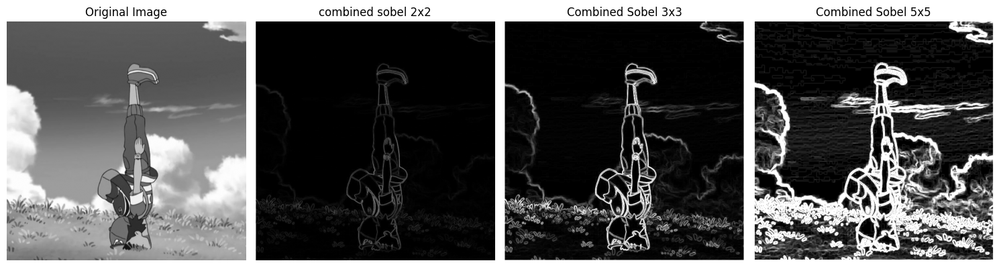

In [ ]:
def sobel_filter_manual(image, kernel):
    image = image.astype(np.float32)
    height, width = image.shape
    kernel_size = kernel.shape[0]
    padding = kernel_size // 2
    padded_img = np.pad(image, ((padding, padding), (padding, padding)), mode='constant', constant_values=0)
    output = np.zeros_like(image)
    for i in range(height):
        for j in range(width):
            region = padded_img[i:i + kernel_size, j:j + kernel_size]
            if region.shape == kernel.shape:
                output[i, j] = np.sum(region * kernel)
    return output

def combine_sobel(sobel_x, sobel_y):
    return np.sqrt(sobel_x**2 + sobel_y**2)


image_path = "ash1.jpg"
gray_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

sobel_kernel_x_2x2 =np.array([[0, 1], [-1, 0]])
sobel_kernel_y_2x2 =np.array([[1, 0], [0, -1]])

sobel_kernel_x_3x3 = np.array([[-1, 0, 1],
                               [-2, 0, 2],
                               [-1, 0, 1]])

sobel_kernel_y_3x3 = np.array([[-1, -2, -1],
                               [0, 0, 0],
                               [1, 2, 1]])

sobel_kernel_x_5x5 = np.array([[-1, -2, 0, 2, 1],
                               [-2, -3, 0, 3, 2],
                               [-3, -5, 0, 5, 3],
                               [-2, -3, 0, 3, 2],
                               [-1, -2, 0, 2, 1]])

sobel_kernel_y_5x5 = np.array([[-1, -2, -3, -2, -1],
                               [-2, -3, -5, -3, -2],
                               [0, 0, 0, 0, 0],
                               [2, 3, 5, 3, 2],
                               [1, 2, 3, 2, 1]])


sobel_x_2x2 = sobel_filter_manual(gray_img, sobel_kernel_x_2x2)
sobel_y_2x2 = sobel_filter_manual(gray_img, sobel_kernel_y_2x2)
combined_2x2 = combine_sobel(sobel_x_2x2, sobel_y_2x2)

sobel_x_3x3 = sobel_filter_manual(gray_img, sobel_kernel_x_3x3)
sobel_y_3x3 = sobel_filter_manual(gray_img, sobel_kernel_y_3x3)
combined_3x3 = combine_sobel(sobel_x_3x3, sobel_y_3x3)

sobel_x_5x5 = sobel_filter_manual(gray_img, sobel_kernel_x_5x5)
sobel_y_5x5 = sobel_filter_manual(gray_img, sobel_kernel_y_5x5)
combined_5x5 = combine_sobel(sobel_x_5x5, sobel_y_5x5)

combined_2x2 = np.clip(combined_2x2, 0, 255)
combined_3x3 = np.clip(combined_3x3, 0, 255)
combined_5x5 = np.clip(combined_5x5, 0, 255)

images = [gray_img,combined_2x2, combined_3x3, combined_5x5]
titles = ["Original Image","combined sobel 2x2", "Combined Sobel 3x3", "Combined Sobel 5x5"]
display_images(images, titles)

In [ ]:

def sobel_filter(image, kernel_size='small'):
    # Define Sobel kernels for X and Y gradients
    kernels = {
        'big': (np.array([[1, 2, 3, 2, 1], [2, 3, 5, 3, 2], [0, 0, 0, 0, 0], [-2, -3, -5, -3, -2], [-1, -2, -3, -2, -1]]),
                np.array([[1, 2, 3, 2, 1], [0, 0, 0, 0, 0], [-1, -2, -3, -2, -1], [-2, -3, -5, -3, -2], [-1, -2, -3, -2, -1]])),
        'medium': (np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]), np.array([[1, 2, 3], [0, 0, 0], [-1, -2, -3]])),
        'small': (np.array([[0, 1], [-1, 0]]), np.array([[1, 0], [0, -1]]))
    }

    kernel_x, kernel_y = kernels[kernel_size]
    h, w = image.shape

    # Padding for borders
    pad = kernel_x.shape[0] // 2
    padded_image = np.pad(image, ((pad, pad), (pad, pad)), mode='constant')

    # Gradient calculation in both directions (X and Y)
    gradient_x = np.zeros_like(image, dtype=np.float32)
    gradient_y = np.zeros_like(image, dtype=np.float32)

    for i in range(h):
        for j in range(w):
            region = padded_image[i:i + kernel_x.shape[0], j:j + kernel_x.shape[1]]
            gradient_x[i, j] = np.sum(region * kernel_x)
            gradient_y[i, j] = np.sum(region * kernel_y)



    # Magnitude of gradients (edge strength)
    sobel_img = np.sqrt(gradient_x**2 + gradient_y**2)

    # Normalize the output image to the range [0, 255]
    sobel_img = np.clip(sobel_img, 0, 255)
